In [1]:
pip install overpy

In [2]:
pip install dash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 20.4 MB/s eta 0:00:00


In [3]:
pip install dash dash-core-components dash-html-components dash-bootstrap-components plotly pandas scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 222.5/222.5 kB 3.6 MB/s eta 0:00:00


In [4]:
import requests
import json

# Overpass API URL
overpass_url = "http://overpass-api.de/api/interpreter"

# Query for schools in Kano
overpass_query_schools = """
[out:json][timeout:25];
area[name="Kano"]->.searchArea;
(
  node["amenity"="school"](area.searchArea);
  way["amenity"="school"](area.searchArea);
  relation["amenity"="school"](area.searchArea);
);
out center;
"""

# Query for hospitals in Kano
overpass_query_hospitals = """
[out:json][timeout:25];
area[name="Kano"]->.searchArea;
(
  node["amenity"="hospital"](area.searchArea);
  way["amenity"="hospital"](area.searchArea);
  relation["amenity"="hospital"](area.searchArea);
);
out center;
"""

# Function to fetch data from Overpass API
def fetch_osm_data(query):
    try:
        response = requests.post(overpass_url, data={'data': query})
        response.raise_for_status()
        return response.json()
    except requests.exceptions.RequestException as e:
        print(f"Error fetching data: {e}")
        return None

# Fetch data for schools
schools_data = fetch_osm_data(overpass_query_schools)

# Fetch data for hospitals
hospitals_data = fetch_osm_data(overpass_query_hospitals)

# Save data to a JSON file for further processing
with open('kano_schools.json', 'w') as f:
    json.dump(schools_data, f)

with open('kano_hospitals.json', 'w') as f:
    json.dump(hospitals_data, f)

print("Data successfully fetched and saved.")

Data successfully fetched and saved.


In [5]:
import json

# Path to your JSON file
file_path = 'kano_hospitals.json'

# Read the JSON data
with open(file_path, 'r') as file:
    data = json.load(file)

# Print the data to check its structure
print(data)

{'version': 0.6, 'generator': 'Overpass API 0.7.62.1 084b4234', 'osm3s': {'timestamp_osm_base': '2024-09-15T23:53:23Z', 'timestamp_areas_base': '2024-09-15T19:19:39Z', 'copyright': 'The data included in this document is from www.openstreetmap.org. The data is made available under ODbL.'}, 'elements': [{'type': 'node', 'id': 2749749839, 'lat': 11.816667, 'lon': 7.9, 'tags': {'amenity': 'hospital'}}, {'type': 'node', 'id': 2923098159, 'lat': 11.4507448, 'lon': 7.7276659, 'tags': {'addr:district': 'Rogo', 'addr:full': 'Falgore, Rogo, Kano', 'addr:municipality': 'Falgore', 'addr:state': 'KN', 'amenity': 'hospital', 'health_facility:type': 'health_centre', 'name': 'Tsara Primary Health Centre', 'source': 'ehealthafrica.org'}}, {'type': 'node', 'id': 2923263866, 'lat': 11.5159251, 'lon': 7.7354815, 'tags': {'addr:district': 'Rogo', 'addr:full': 'Gwangwan, Rogo, Kano', 'addr:municipality': 'Gwangwan', 'addr:state': 'KN', 'amenity': 'hospital', 'health_facility:type': 'dispensary', 'name': 'Da

In [6]:
import pandas as pd
import json

# Load JSON data
with open(file_path, 'r') as file:
    data = json.load(file)

# Use json_normalize if the data is nested
# Replace 'elements' with the actual key that contains the list of dictionaries
df = pd.json_normalize(data, 'elements')

# Display the DataFrame
print(df.head())

   type          id        lat       lon tags.amenity tags.addr:district  \
0  node  2749749839  11.816667  7.900000     hospital                NaN   
1  node  2923098159  11.450745  7.727666     hospital               Rogo   
2  node  2923263866  11.515925  7.735481     hospital               Rogo   
3  node  2923263867  11.400621  7.858888     hospital               Rogo   
4  node  2923263868  11.487072  7.747225     hospital               Rogo   

         tags.addr:full tags.addr:municipality tags.addr:state  \
0                   NaN                    NaN             NaN   
1   Falgore, Rogo, Kano                Falgore              KN   
2  Gwangwan, Rogo, Kano               Gwangwan              KN   
3   Fulatan, Rogo, Kano                Fulatan              KN   
4  Gwangwan, Rogo, Kano               Gwangwan              KN   

  tags.health_facility:type  ... tags.alt_name tags.source:alt_name  \
0                       NaN  ...           NaN                  NaN   
1   

In [7]:
import overpy
import pandas as pd

# Initialize Overpass API
api = overpy.Overpass()

# Define query for hospitals, clinics, and schools in Kano
query = """
[out:json];
area["name"="Kano"]->.searchArea;
(
  node["amenity"="hospital"](area.searchArea);
  node["amenity"="clinic"](area.searchArea);
  node["amenity"="school"](area.searchArea);
  way["amenity"="hospital"](area.searchArea);
  way["amenity"="clinic"](area.searchArea);
  way["amenity"="school"](area.searchArea);
  relation["amenity"="hospital"](area.searchArea);
  relation["amenity"="clinic"](area.searchArea);
  relation["amenity"="school"](area.searchArea);
);
out body;
>;
out skel qt;
"""

# Perform the query
result = api.query(query)

# Process data
data = []
for node in result.nodes:
    data.append({
        'name': node.tags.get('name', 'Unnamed'),
        'latitude': node.lat,
        'longitude': node.lon,
        'type': node.tags.get('amenity', 'unknown')
    })

for way in result.ways:
    for node in way.nodes:
        data.append({
            'name': way.tags.get('name', 'Unnamed'),
            'latitude': node.lat,
            'longitude': node.lon,
            'type': way.tags.get('amenity', 'unknown')
        })

# Convert to DataFrame
df = pd.DataFrame(data)

# Save to CSV
df.to_csv('kano_infrastructure.csv', index=False)

# Display the first few rows
print(df.head())

                                        name    latitude  longitude      type
0                               Kawo Primary  11.9818566  8.5718136    school
1                                    Unnamed  11.8166670  7.9000000  hospital
2  Madarasatu Amina Islamiyya Primary School  12.0272812  8.5510320    school
3                Tsara Primary Health Centre  11.4507448  7.7276659  hospital
4                         Dayaso Health Post  11.5159251  7.7354815  hospital


In [8]:
import pandas as pd

# Load the data
df = pd.read_csv('kano_infrastructure.csv')

# Display basic info
print(df.info())

# Filter specific types if needed
df_schools = df[df['type'] == 'school']
df_hospitals = df[df['type'] == 'hospital']
df_clinics = df[df['type'] == 'clinic']

# Save filtered data to CSV
df_schools.to_csv('kano_schools.csv', index=False)
df_hospitals.to_csv('kano_hospitals.csv', index=False)
df_clinics.to_csv('kano_clinics.csv', index=False)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9873 entries, 0 to 9872
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   name       9873 non-null   object 
 1   latitude   9873 non-null   float64
 2   longitude  9873 non-null   float64
 3   type       9873 non-null   object 
dtypes: float64(2), object(2)
memory usage: 308.7+ KB
None


In [9]:
df_hospitals.head()

,name,latitude,longitude,type
1,Unnamed,11.816667,7.900000,hospital
3,Tsara Primary Health Centre,11.450745,7.727666,hospital
4,Dayaso Health Post,11.515925,7.735481,hospital
5,Fulatan Primary Health Centre,11.400621,7.858888,hospital
6,Gwangwan Primary Health Centre,11.487072,7.747225,hospital


In [10]:
df_clinics.head()

,name,latitude,longitude,type
148,Unnamed,11.698833,9.085975,clinic


In [11]:
df_schools.head()

,name,latitude,longitude,type
0,Kawo Primary,11.981857,8.571814,school
2,Madarasatu Amina Islamiyya Primary School,12.027281,8.551032,school
142,Fgc A,11.948900,8.560840,school
143,Governor's College,11.990424,8.532391,school
144,Adda Secondary School,11.966640,8.531887,school


In [12]:
import overpy
import pandas as pd

# Initialize Overpass API
api = overpy.Overpass()

# Define query for tertiary institutions, including universities, in Kano
query = """
[out:json];
area["name"="Kano"]->.searchArea;
(
  node["amenity"="university"](area.searchArea);
  node["amenity"="college"](area.searchArea);
  node["amenity"="tertiary"](area.searchArea);
  way["amenity"="university"](area.searchArea);
  way["amenity"="college"](area.searchArea);
  way["amenity"="tertiary"](area.searchArea);
  relation["amenity"="university"](area.searchArea);
  relation["amenity"="college"](area.searchArea);
  relation["amenity"="tertiary"](area.searchArea);
);
out body;
> ;
out skel qt;
"""

# Perform the query
result = api.query(query)

# Process data
data = []
for node in result.nodes:
    data.append({
        'name': node.tags.get('name', 'Unnamed'),
        'latitude': node.lat,
        'longitude': node.lon,
        'type': node.tags.get('amenity', 'unknown')
    })

for way in result.ways:
    for node in way.nodes:
        data.append({
            'name': way.tags.get('name', 'Unnamed'),
            'latitude': node.lat,
            'longitude': node.lon,
            'type': way.tags.get('amenity', 'unknown')
        })

# Convert to DataFrame
df = pd.DataFrame(data)

# Save to CSV
df.to_csv('kano_tertiary_institutions.csv', index=False)

# Display the first few rows
print(df.head())


                name    latitude  longitude        type
0  Bayero University  12.0160591  8.5065423  university
1            Unnamed  11.9623051  8.4106151     unknown
2            Unnamed  11.9619706  8.4112302     unknown
3            Unnamed  11.9614082  8.4125565     unknown
4            Unnamed  11.9608014  8.4139402     unknown


In [13]:
import overpy
import pandas as pd

# Initialize Overpass API
api = overpy.Overpass()

# Define query for polytechnics, universities, and colleges in Kano
query = """
[out:json];
area["name"="Kano"]->.searchArea;
(
  node["amenity"="university"](area.searchArea);
  node["amenity"="college"](area.searchArea);
  node["amenity"="polytechnic"](area.searchArea);
  way["amenity"="university"](area.searchArea);
  way["amenity"="college"](area.searchArea);
  way["amenity"="polytechnic"](area.searchArea);
  relation["amenity"="university"](area.searchArea);
  relation["amenity"="college"](area.searchArea);
  relation["amenity"="polytechnic"](area.searchArea);
);
out body;
> ;
out skel qt;
"""

# Perform the query
result = api.query(query)

# Process data
data = []
for node in result.nodes:
    data.append({
        'name': node.tags.get('name', 'Unnamed'),
        'latitude': node.lat,
        'longitude': node.lon,
        'type': node.tags.get('amenity', 'unknown')
    })

for way in result.ways:
    for node in way.nodes:
        data.append({
            'name': way.tags.get('name', 'Unnamed'),
            'latitude': node.lat,
            'longitude': node.lon,
            'type': way.tags.get('amenity', 'unknown')
        })

# Convert to DataFrame
df = pd.DataFrame(data)

# Save to CSV
df.to_csv('kano_tertiary_institutions.csv', index=False)

# Display the first few rows
print(df.head())

                name    latitude  longitude        type
0  Bayero University  12.0160591  8.5065423  university
1            Unnamed  11.9623051  8.4106151     unknown
2            Unnamed  11.9619706  8.4112302     unknown
3            Unnamed  11.9614082  8.4125565     unknown
4            Unnamed  11.9608014  8.4139402     unknown


In [14]:
import overpy
import pandas as pd

# Initialize Overpass API
api = overpy.Overpass()

# Define query for universities and colleges in Kano
query = """
[out:json];
area["name"="Kano"]->.searchArea;
(
  node["amenity"="university"](area.searchArea);
  node["amenity"="college"](area.searchArea);
  node["amenity"="polytechnic"](area.searchArea);
  way["amenity"="university"](area.searchArea);
  way["amenity"="college"](area.searchArea);
  way["amenity"="polytechnic"](area.searchArea);
  relation["amenity"="university"](area.searchArea);
  relation["amenity"="college"](area.searchArea);
  relation["amenity"="polytechnic"](area.searchArea);
);
out body;
> ;
out skel qt;
"""

# Perform the query
result = api.query(query)

# Define the list of institutions to filter
required_institutions = [
    'Bayero University', 'Unnamed', 'NorthWest University',
    'Mambayya House Bayero University', 'Department of Accounting',
    'Musa Abdullahi Auditorium', "Vice Chancellor's Mosque",
    'Faculty of Computer Science & Information Technology/Centre for Information Technology',
    'Department of Business Administration and Entrepreneurship',
    'Bayero University Kano',
    'Centre for African Entrepreneurship Research & Traininng',
    'Centre for Research in Nigeria Languages and Folklore',
    'Department of Education', 'Department of Sociology and Geography',
    'Faculty of Education Complex',
    'Laboratory & Learning Resource Centre', 'Dangote Business School',
    'Security Office', 'Zonal Advanced Spaced Applications Laboratory',
    'Centre for Excellence',
    'Kano University of Science and Technology',
    'Isiyaka Rabiu College of Quranic Studies'
]

# Process data
data = []
for node in result.nodes:
    name = node.tags.get('name', 'Unnamed')
    if name in required_institutions:
        data.append({
            'name': name,
            'latitude': node.lat,
            'longitude': node.lon,
            'type': node.tags.get('amenity', 'unknown')
        })

for way in result.ways:
    name = way.tags.get('name', 'Unnamed')
    if name in required_institutions:
        for node in way.nodes:
            data.append({
                'name': name,
                'latitude': node.lat,
                'longitude': node.lon,
                'type': way.tags.get('amenity', 'unknown')
            })

# Convert to DataFrame
df = pd.DataFrame(data)

# Save to CSV
df.to_csv('filtered_tertiary_institutions.csv', index=False)

# Display the first few rows
print(df.head())

                name    latitude  longitude        type
0  Bayero University  12.0160591  8.5065423  university
1            Unnamed  11.9623051  8.4106151     unknown
2            Unnamed  11.9619706  8.4112302     unknown
3            Unnamed  11.9614082  8.4125565     unknown
4            Unnamed  11.9608014  8.4139402     unknown


In [15]:
import pandas as pd

# Load your dataset
#file_path = 'your_dataset.csv'  # Replace with your actual file path
df = pd.read_csv('kano_tertiary_institutions.csv')

import pandas as pd

# Load your dataset
#file_path = 'your_dataset.csv'  # Replace with your actual file path
#df = pd.read_csv(file_path)

# Define the list of institutions to keep
required_institutions = [
    'Bayero University', 'NorthWest University',
    'Mambayya House Bayero University', 'Department of Accounting',
    'Musa Abdullahi Auditorium', "Vice Chancellor's Mosque",
    'Faculty of Computer Science & Information Technology/Centre for Information Technology',
    'Department of Business Administration and Entrepreneurship',
    'Bayero University Kano',
    'Centre for African Entrepreneurship Research & Traininng',
    'Centre for Research in Nigeria Languages and Folklore',
    'Department of Education', 'Department of Sociology and Geography',
    'Faculty of Education Complex',
    'Laboratory & Learning Resource Centre', 'Dangote Business School',
    'Security Office', 'Zonal Advanced Spaced Applications Laboratory',
    'Centre for Excellence',
    'Kano University of Science and Technology',
    'Isiyaka Rabiu College of Quranic Studies'
]

# Filter the dataset to keep only the required institutions
filtered_df = df[df['name'].isin(required_institutions)]

# Drop rows where 'name' is 'Unnamed'
filtered_df = filtered_df[filtered_df['name'] != 'Unnamed']

# Save the filtered data to a new CSV file
filtered_df.to_csv('filtered_tertiary_institutions.csv', index=False)

# Display the filtered data
print(filtered_df.head())

                     name   latitude  longitude        type
0       Bayero University  12.016059   8.506542  university
402  NorthWest University  11.991831   8.531209  university
403  NorthWest University  11.991905   8.531370  university
404  NorthWest University  11.991621   8.531504  university
405  NorthWest University  11.991679   8.531767  university


In [16]:
import pandas as pd

# Load your DataFrames
kano_clinics = pd.read_csv('kano_clinics.csv')  # Replace with your actual file path
kano_hospitals = pd.read_csv('kano_hospitals.csv')  # Replace with your actual file path
kano_schools = pd.read_csv('kano_schools.csv')  # Replace with your actual file path
filtered_tertiary_institutions = pd.read_csv('filtered_tertiary_institutions.csv')  # Replace with your actual file path

# Combine all DataFrames into one
df = pd.concat([kano_clinics, kano_hospitals, kano_schools, filtered_tertiary_institutions], ignore_index=True)

# Save the combined DataFrame to a new CSV file
df.to_csv('kano_state_schools_and_hospitals.csv', index=False)

# Display the combined DataFrame
print(df.head())

                            name   latitude  longitude      type
0                        Unnamed  11.698833   9.085975    clinic
1                        Unnamed  11.816667   7.900000  hospital
2    Tsara Primary Health Centre  11.450745   7.727666  hospital
3             Dayaso Health Post  11.515925   7.735481  hospital
4  Fulatan Primary Health Centre  11.400621   7.858888  hospital


In [17]:
import folium
import pandas as pd

# Load the filtered data
df = pd.read_csv('kano_state_schools_and_hospitals.csv')

# Initialize the map
kano_map = folium.Map(location=[12.0022, 8.5919], zoom_start=12)

# Add markers for filtered tertiary institutions
for _, row in df.iterrows():
    folium.Marker(
        location=[row['latitude'], row['longitude']],
        popup=row['name'] + ' (' + row['type'] + ')',
        icon=folium.Icon(color='blue', icon='info-sign')
    ).add_to(kano_map)

# Save the map
kano_map.save('filtered_tertiary_institutions_map.html')

In [18]:
import folium
from folium import FeatureGroup

# Initialize the map centered around Kano
kano_map = folium.Map(location=[12.0022, 8.5919], zoom_start=12)

# Feature groups for different infrastructure categories
schools_fg = FeatureGroup(name="Schools")
hospitals_fg = FeatureGroup(name="Hospitals")
tertiary_fg = FeatureGroup(name="Tertiary Institutions")

# Add schools to the map
for index, row in kano_schools.iterrows():
    if pd.notna(row['latitude']) and pd.notna(row['longitude']):
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            icon=folium.Icon(color='blue', icon='education')
        ).add_to(schools_fg)

# Add hospitals to the map
for index, row in kano_hospitals.iterrows():
    if pd.notna(row['latitude']) and pd.notna(row['longitude']):
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            icon=folium.Icon(color='red', icon='plus-sign')
        ).add_to(hospitals_fg)

# Add tertiary institutions to the map
for index, row in filtered_tertiary_institutions.iterrows():
    if pd.notna(row['latitude']) and pd.notna(row['longitude']):
        folium.Marker(
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            icon=folium.Icon(color='green', icon='university')
        ).add_to(tertiary_fg)

# Add feature groups to the map
schools_fg.add_to(kano_map)
hospitals_fg.add_to(kano_map)
tertiary_fg.add_to(kano_map)

# Add Layer Control
folium.LayerControl().add_to(kano_map)

# Save and display the map
kano_map.save("kano_infrastructure_map_with_layers.html")
kano_map

In [19]:
import pandas as pd
import folium
from folium.plugins import MarkerCluster

# Load the dataset
df = pd.read_csv('kano_state_schools_and_hospitals.csv')

def create_folium_map(selected_features):
    # Create a base map
    m = folium.Map(location=[11.999, 8.522], zoom_start=11)

    # Create marker clusters for different categories
    school_cluster = MarkerCluster(name='Schools').add_to(m)
    hospital_cluster = MarkerCluster(name='Hospitals').add_to(m)
    university_cluster = MarkerCluster(name='Universities').add_to(m)

    # Add markers based on the selected features
    for _, row in df.iterrows():
        if row['type'] == 'school' and 'School' in selected_features:
            folium.Marker(
                location=[row['latitude'], row['longitude']],
                popup=row['name'],
                icon=folium.Icon(color='blue', icon='graduation-cap', prefix='fa')
            ).add_to(school_cluster)
        elif row['type'] == 'hospital' and 'Hospital' in selected_features:
            folium.Marker(
                location=[row['latitude'], row['longitude']],
                popup=row['name'],
                icon=folium.Icon(color='red', icon='hospital-o', prefix='fa')
            ).add_to(hospital_cluster)
        elif row['type'] == 'university' and 'University' in selected_features:
            folium.Marker(
                location=[row['latitude'], row['longitude']],
                popup=row['name'],
                icon=folium.Icon(color='green', icon='university', prefix='fa')
            ).add_to(university_cluster)

    # Add layer control to switch between different clusters
    folium.LayerControl().add_to(m)

    return m

# Generate and save the HTML map
selected_features = ['School', 'Hospital', 'University']
map_obj = create_folium_map(selected_features)
map_obj.save('kano_infrastructure_map.html')

1. Load and Inspect the Data
First, load your data and get a sense of its structure and contents.

In [20]:
import pandas as pd

# Load the dataset
df = pd.read_csv('kano_state_schools_and_hospitals.csv')

# Display the first few rows of the dataframe
print(df.head())

# Display summary statistics and data types
print(df.info())
print(df.describe())


                            name   latitude  longitude      type
0                        Unnamed  11.698833   9.085975    clinic
1                        Unnamed  11.816667   7.900000  hospital
2    Tsara Primary Health Centre  11.450745   7.727666  hospital
3             Dayaso Health Post  11.515925   7.735481  hospital
4  Fulatan Primary Health Centre  11.400621   7.858888  hospital
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5130 entries, 0 to 5129
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   name       5130 non-null   object 
 1   latitude   5130 non-null   float64
 2   longitude  5130 non-null   float64
 3   type       5130 non-null   object 
dtypes: float64(2), object(2)
memory usage: 160.4+ KB
None
          latitude    longitude
count  5130.000000  5130.000000
mean     11.968768     8.445325
std       0.303274     0.320810
min      10.575865     7.694332
25%      11.824939     8.230919
50%      11.9

2. Data Cleaning
Ensure that your data is clean and ready for analysis. This includes handling missing values, checking for duplicates, and validating data types.

In [21]:
# Check for missing values
print(df.isnull().sum())

# Drop duplicates if any
df = df.drop_duplicates()

# Fill or drop missing values as needed
df = df.dropna()  # Example: drop rows with any missing values

# Verify data types
print(df.dtypes)


name         0
latitude     0
longitude    0
type         0
dtype: int64
name          object
latitude     float64
longitude    float64
type          object
dtype: object


3. Data Distribution and Visualization
Analyze the distribution of different types of infrastructure and visualize the data to identify patterns and trends.

<ipython-input-22-c01e4ff6a9ec>:9: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=type_counts.index, y=type_counts.values, palette='viridis')


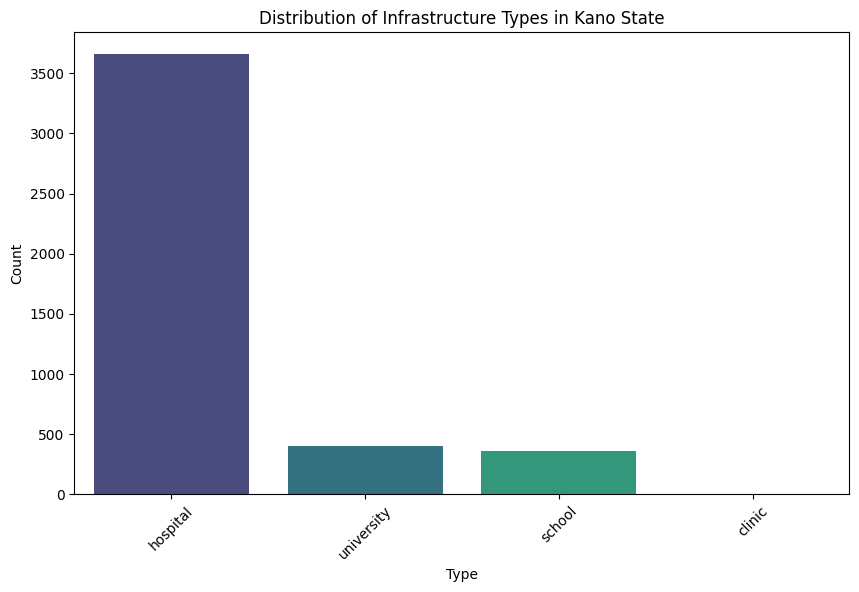

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Count the number of facilities by type
type_counts = df['type'].value_counts()

# Plot the distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=type_counts.index, y=type_counts.values, palette='viridis')
plt.title('Distribution of Infrastructure Types in Kano State')
plt.xlabel('Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


Geospatial Distribution
Visualize the geospatial distribution of different types of facilities using scatter plots.

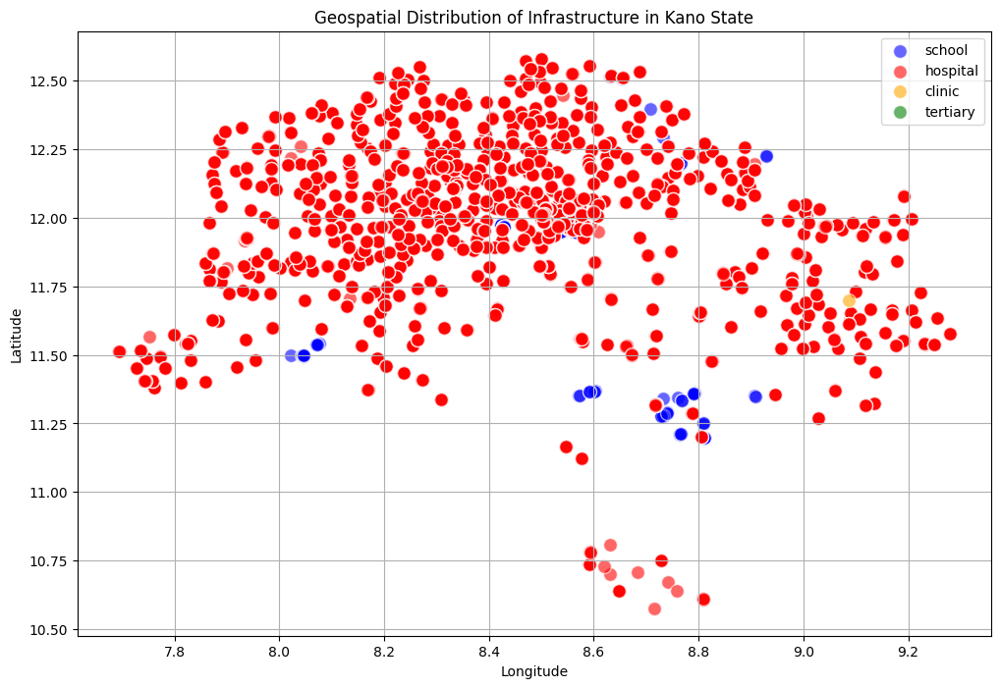

In [23]:
# Plot geospatial distribution of different types
plt.figure(figsize=(12, 8))

for facility_type, color in [('school', 'blue'), ('hospital', 'red'), ('clinic', 'orange'), ('tertiary', 'green')]:
    subset = df[df['type'] == facility_type]
    plt.scatter(subset['longitude'], subset['latitude'], color=color, label=facility_type, alpha=0.6, edgecolors='w', s=100)

plt.title('Geospatial Distribution of Infrastructure in Kano State')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)
plt.show()


4. Spatial Clustering Analysis
Identify clusters of facilities to understand the density and distribution.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


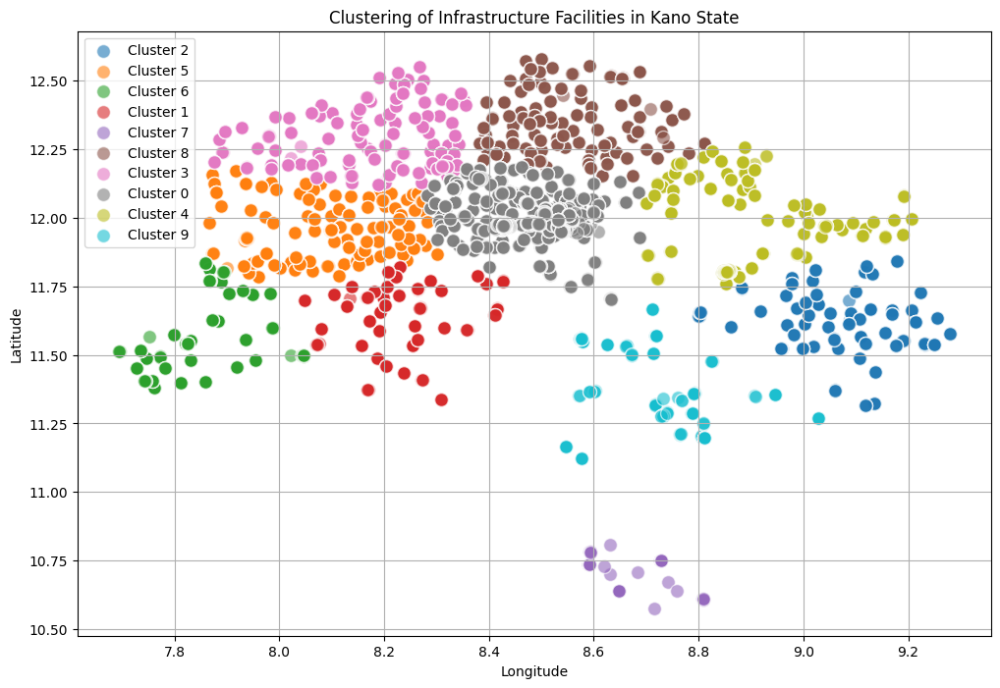

In [24]:
from sklearn.cluster import KMeans
import numpy as np

# Prepare data for clustering
X = df[['latitude', 'longitude']].values

# Apply KMeans clustering
kmeans = KMeans(n_clusters=10, random_state=0).fit(X)
df['cluster'] = kmeans.labels_

# Visualize clusters
plt.figure(figsize=(12, 8))

for cluster in df['cluster'].unique():
    subset = df[df['cluster'] == cluster]
    plt.scatter(subset['longitude'], subset['latitude'], label=f'Cluster {cluster}', alpha=0.6, edgecolors='w', s=100)

plt.title('Clustering of Infrastructure Facilities in Kano State')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.grid(True)
plt.show()


<ipython-input-25-6715a1e15785>:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=coverage.index, y=coverage.values, palette='plasma')


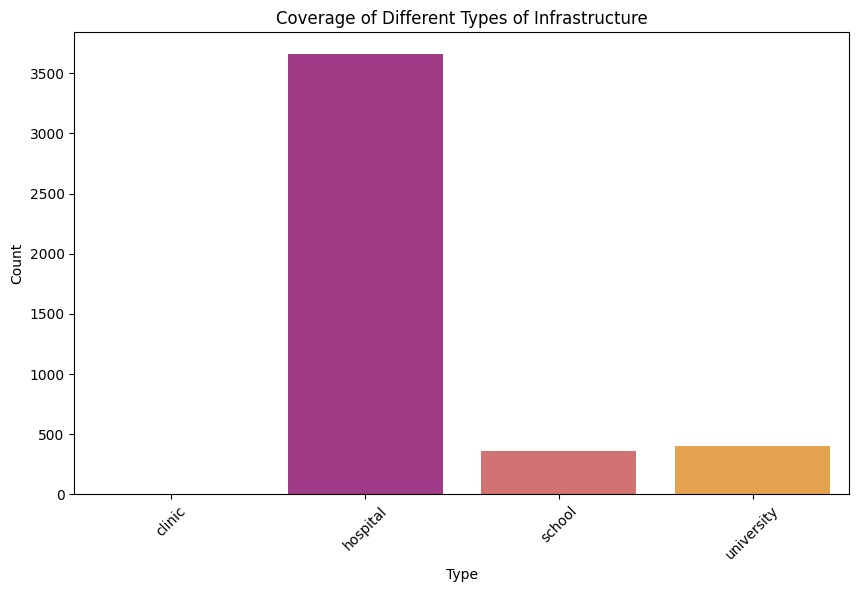

In [25]:
# Calculate coverage of different types
coverage = df.groupby('type').size()

# Plot coverage
plt.figure(figsize=(10, 6))
sns.barplot(x=coverage.index, y=coverage.values, palette='plasma')
plt.title('Coverage of Different Types of Infrastructure')
plt.xlabel('Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


In [26]:
import folium
from folium.plugins import HeatMap

# Create a base map
heatmap_map = folium.Map(location=[11.999, 8.522], zoom_start=11)
import folium
from folium.plugins import HeatMap
from folium import FeatureGroup, LayerControl, Icon, Marker

# Create a base map
base_map = folium.Map(location=[11.999, 8.522], zoom_start=11)

# Create feature groups for different types of infrastructure
school_group = FeatureGroup(name='Schools')
hospital_group = FeatureGroup(name='Hospitals')
university_group = FeatureGroup(name='Universities')

# Add heatmap layer
heat_data = [[row['latitude'], row['longitude']] for index, row in df.iterrows()]
HeatMap(heat_data).add_to(base_map)

# Add markers for different types of infrastructure with labels
for _, row in df.iterrows():
    if row['type'] == 'school':
        Marker(
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            icon=Icon(color='blue', icon='graduation-cap', prefix='fa'),
            tooltip=row['name']  # Add tooltip label
        ).add_to(school_group)
    elif row['type'] == 'hospital':
        Marker(
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            icon=Icon(color='red', icon='hospital-o', prefix='fa'),
            tooltip=row['name']  # Add tooltip label
        ).add_to(hospital_group)
    elif row['type'] == 'university':
        Marker(
            location=[row['latitude'], row['longitude']],
            popup=row['name'],
            icon=Icon(color='green', icon='university', prefix='fa'),
            tooltip=row['name']  # Add tooltip label
        ).add_to(university_group)

# Add feature groups to the base map
school_group.add_to(base_map)
hospital_group.add_to(base_map)
university_group.add_to(base_map)

# Add layer control
LayerControl().add_to(base_map)

# Add a custom legend using HTML
legend_html = """
     <div style="position: fixed;
                 bottom: 50px; left: 50px; width: 150px; height: 120px;
                 background-color: white; border:2px solid grey; z-index:9999;
                 font-size:14px; padding: 10px;">
     <b>Legend</b><br>
     <i class="fa fa-graduation-cap" style="color: blue"></i> School<br>
     <i class="fa fa-hospital-o" style="color: red"></i> Hospital<br>
     <i class="fa fa-university" style="color: green"></i> University
     </div>
     """
base_map.get_root().html.add_child(folium.Element(legend_html))

# Add a custom title using HTML
title_html = """
     <div style="position: fixed;
                 top: 10px; left: 50%; transform: translateX(-50%);
                 background-color: white; border:2px solid grey;
                 font-size:18px; padding: 10px; z-index:9999;">
     <b>Kano State Infrastructure Map</b><br>
     <i>Critical Infrastructure Overview for Healthcare, Education, and more</i>
     </div>
     """
base_map.get_root().html.add_child(folium.Element(title_html))

# Save the map
base_map.save('kano_infrastructure_map_with_title_and_layers.html')

# Prepare data for heatmap
heat_data = [[row['latitude'], row['longitude']] for index, row in df.iterrows()]

# Add heatmap layer
HeatMap(heat_data).add_to(heatmap_map)

# Save heatmap map
heatmap_map.save('new_kano_infrastructure_heatmap.html')


<ipython-input-27-bf7a9ca317eb>:39: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  plt.legend()


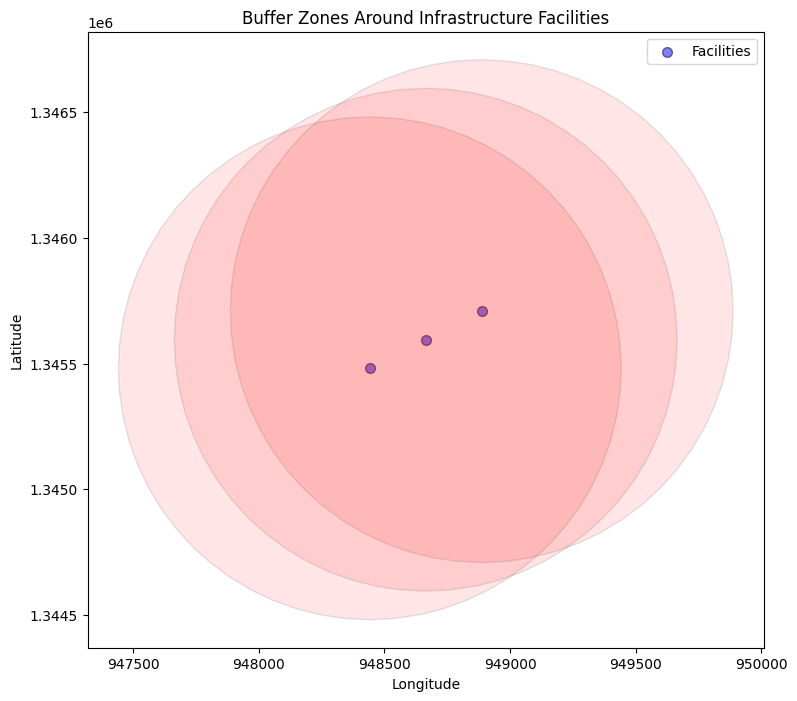

In [27]:
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point

# Sample data
data = {
    'name': ['School A', 'Hospital B', 'University C'],
    'latitude': [11.999, 12.000, 11.998],
    'longitude': [8.522, 8.524, 8.520],
    'type': ['school', 'hospital', 'university']
}

# Create a GeoDataFrame
gdf = gpd.GeoDataFrame(data,
                       geometry=gpd.points_from_xy(data['longitude'], data['latitude']),
                       crs="EPSG:4326")

# Define buffer distance in meters (e.g., 1000 meters)
buffer_distance = 1000  # 1 km

# Convert CRS to a projection suitable for distance calculations
gdf = gdf.to_crs(epsg=3857)  # Web Mercator

# Create buffer
gdf['buffer'] = gdf.buffer(buffer_distance)

# Plotting
fig, ax = plt.subplots(figsize=(12, 8))

# Plot original points
gdf.plot(ax=ax, color='blue', alpha=0.5, edgecolor='k', markersize=50, label='Facilities')

# Plot buffer zones
gdf['buffer'].plot(ax=ax, color='red', alpha=0.1, edgecolor='k', label='Buffer Zones')

plt.title('Buffer Zones Around Infrastructure Facilities')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()


In [28]:
from scipy.spatial import distance_matrix

# Example points of interest (e.g., population centers)
poi = pd.DataFrame({
    'name': ['Population Center 1', 'Population Center 2'],
    'latitude': [12.000, 12.010],
    'longitude': [8.500, 8.520]
})

# Convert POI to GeoDataFrame
poi_gdf = gpd.GeoDataFrame(poi, geometry=gpd.points_from_xy(poi.longitude, poi.latitude))

# Calculate distance matrix
dist_matrix = distance_matrix(poi_gdf[['latitude', 'longitude']], df[['latitude', 'longitude']])

# Find nearest facility for each POI
nearest_facility_index = dist_matrix.argmin(axis=1)
nearest_facilities = df.iloc[nearest_facility_index]

# Merge with POI for a summary
poi_with_nearest = poi.copy()
poi_with_nearest['nearest_facility'] = nearest_facilities['name'].values
poi_with_nearest['nearest_facility_type'] = nearest_facilities['type'].values

print(poi_with_nearest)


                  name  latitude  longitude  \
0  Population Center 1     12.00       8.50   
1  Population Center 2     12.01       8.52   

                     nearest_facility nearest_facility_type  
0              Bakin Ruwa Health Post              hospital  
1  Fuskar Gabas Primary Health Centre              hospital  


In [29]:
import dash
import dash_core_components as dcc
import dash_html_components as html
import plotly.express as px

# Initialize Dash app
app = dash.Dash(__name__)

# Create a scatter plot
fig = px.scatter(df, x='longitude', y='latitude', color='type', title='Infrastructure Distribution')

# Define layout
app.layout = html.Div([
    html.H1("Kano State Infrastructure Dashboard"),
    dcc.Graph(figure=fig),
    # Additional components such as filters and interactive maps can be added here
])

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


<ipython-input-29-835c2103c572>:2: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc
<ipython-input-29-835c2103c572>:3: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html


<IPython.core.display.Javascript object>

In [30]:
df.name.unique()

array(['Unnamed', 'Tsara Primary Health Centre', 'Dayaso Health Post',
       'Fulatan Primary Health Centre', 'Gwangwan Primary Health Centre',
       'Hago Primary Health Centre', 'Ruwan Bago Health Post',
       'Sundu Health Post', 'Tudun Magaji Health Post',
       'Unguwar Liman Health Post', 'Unguwar Malam Amadu Health Post',
       'Zarewa Primary Health Centre', 'Bari Primary Health Centre',
       'Kaleku Health Post', 'Karshi Health Post',
       'Kauyen Liman Health Post', 'Rogo General Hospital',
       'Tsohuwar Rogo Health Post', 'Zoza Health Post',
       "Ba'Awa Health Post", 'Jajaye Primary Health Centre',
       'Maska Health Post', 'Sagondare Health Post',
       'Yanoko Primary Health Centre', 'Dalal Health Post',
       'Dambazau Health Post', 'Daura Health Post', 'Dederi Health Post',
       'Dutsan Amare Health Post', 'Kadafa Health Post',
       'Kara Primary Health Centre', 'Kurugu Health Post',
       'Sabon Birni Primary Health Centre', 'Sabon Fegi Health Po